# Μέρος 1. Ανίχνευση Ακμών σε Γκρίζες Εικόνες


## 1.1 Δημιουργία Εικόνων Εισόδου

C:\Users\munro\anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if __name__ == "__main__":


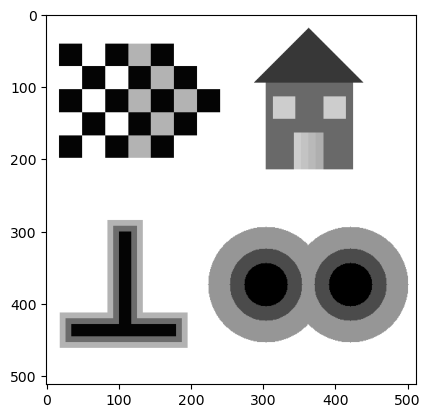

In [1]:
#1.1.1
import cv2
import matplotlib.pyplot as plt
import numpy as np

image = cv2.imread("edgetest_23.png",cv2.IMREAD_GRAYSCALE)

#normalize image to [0,1] 
image = image.astype(np.float)/255

img_height, img_width = image.shape
plt.imshow(image,cmap='gray')

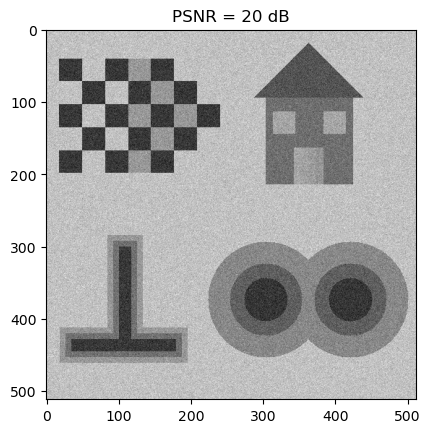

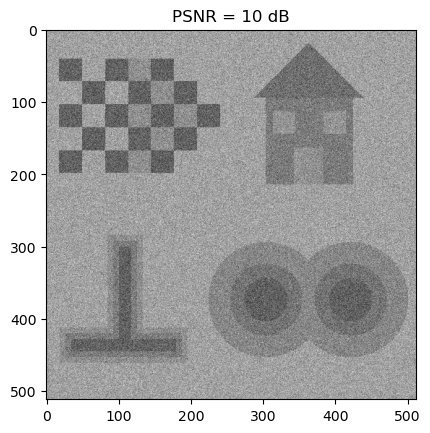

In [2]:
#1.1.2
import numpy as np

def sigma_n(PSNR: int,
          img_max:int,
          img_min:int):
  return ((img_max - img_min)/(10**(PSNR/20)))

img_max = image.max()
img_min = image.min()

#image 1: PSNR = 20 dB
PSNR1 = 20
image1 = image + np.random.normal(0,sigma_n(PSNR1,img_max,img_min),size=(img_height,img_width))
plt.title("PSNR = 20 dB")
plt.imshow(image1,cmap='gray')
plt.show()

#image 2: PSNR = 10 dB
PSNR2 = 10
image2 = image + np.random.normal(0,sigma_n(PSNR2,img_max,img_min),size=(img_height,img_width))
plt.title("PSNR = 10 dB")
plt.imshow(image2,cmap='gray')
plt.show()


## 1.2  Υλοποίηση Αλγορίθμων Ανίχνευσης Ακμών

### Προεργασία

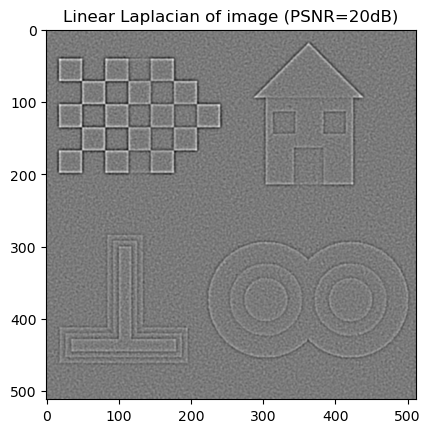

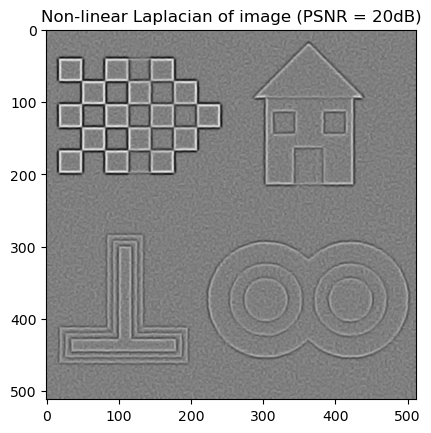

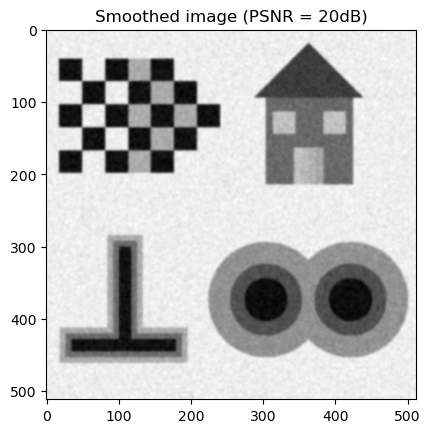

In [3]:
#1.2.1

#Smoothing
sigma = 1.5
n = int(2*np.ceil(3*sigma)+1)

G1D = cv2.getGaussianKernel(n,sigma) #1D gaussian filter
G2D = G1D @ G1D.T #symmetric 2D gaussian filter


def LoG(n,sigma):
  #cv2.Laplacian(G2D,cv2.CV_64F)
  x = np.linspace(-n/2,n/2,n)
  y = np.linspace(-n/2,n/2,n)
  X,Y = np.meshgrid(x,y)

  Z = (X**2 + Y**2-2*sigma**2)/(2*np.pi*sigma**6)
  Z *= np.exp(-(X**2+Y**2)/(2*sigma**2))
  return Z

'''
smooth1 = cv2.filter2D(image1,-1,cv2.Laplacian(G2D,cv2.CV_64F))
smooth2 = cv2.filter2D(image1,-1,LoG(n,sigma))
plt.imshow(smooth1,cmap='gray')
plt.show()

plt.imshow(smooth2,cmap='gray')
plt.show()
'''

#1.2.2
#The 2 types od Laplacian 
L1 = cv2.filter2D(image1,-1,LoG(n,sigma)) 
plt.imshow(L1,cmap='gray')
plt.title("Linear Laplacian of image (PSNR=20dB)")
plt.show()

#Non-Linear (L2)
kernel = np.array([[0,1,0],
                  [1,1,1],
                  [0,1,0]], dtype=np.uint8)

smoothed_img = cv2.filter2D(image1,-1,G2D)

L2 = cv2.dilate(smoothed_img,kernel)+cv2.erode(smoothed_img,kernel)-2*smoothed_img

plt.imshow(L2,cmap='gray')
plt.title("Non-linear Laplacian of image (PSNR = 20dB)")
plt.show()

plt.imshow(smoothed_img,cmap='gray')
plt.title("Smoothed image (PSNR = 20dB)")
plt.show()

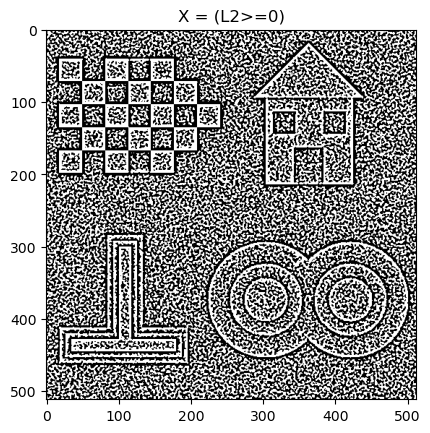

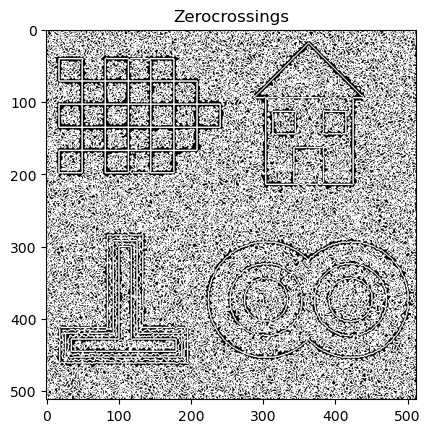

In [4]:
#1.2.3
X = (L1 >= 0) #pick only those pixels with non-zero values
X = X.astype(np.uint8)
plt.imshow(X,cmap="gray")
plt.title("X = (L2>=0)")
plt.show()


#find image's zerocrossings
Y = cv2.dilate(X,kernel) - cv2.erode(X,kernel)
plt.imshow(Y,cmap="gray")
plt.title("Zerocrossings")
plt.show()


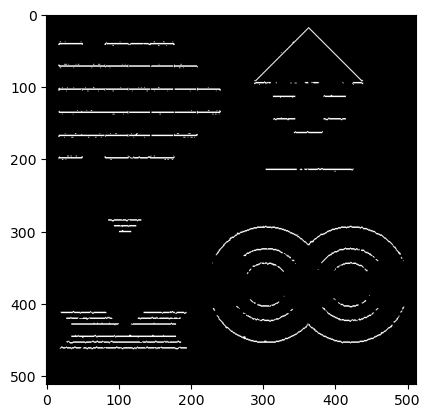

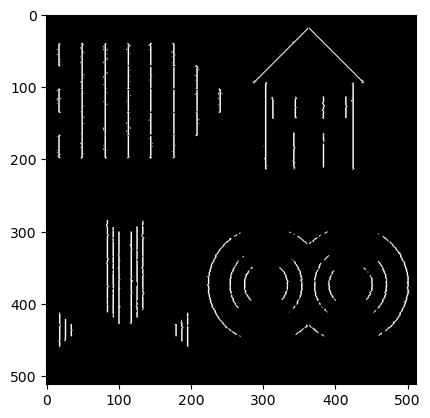

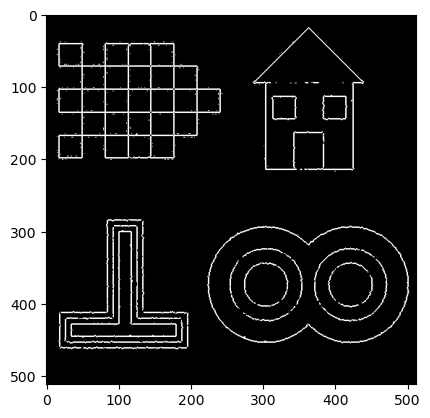

In [5]:
#1.2.4
#Threshold on Zerocrossing
height, width = Y.shape

img_gradient = np.array(np.gradient(smoothed_img))
theta = 0.2

#find the max values of both axis gradient
max1 = np.absolute(img_gradient[0]).max()
max2 = np.absolute(img_gradient[1]).max()

#find edges of both axis gradients
edges1 = (np.logical_and(Y==1,np.absolute(img_gradient[0])>theta*max1)).astype(int)
edges2 = (np.logical_and(Y==1,np.absolute(img_gradient[1])>theta*max2)).astype(int)

result = np.logical_or(edges1,edges2)

plt.imshow(edges1,cmap='gray')
plt.show()

plt.imshow(edges2,cmap='gray')
plt.show()

plt.imshow(result,cmap='gray')
plt.show()



### Το ζητούμενο

In [6]:
def EdgeDetect(image:np.array,
               sigma:int,
               theta:int,
               type_of_filter:str):
  assert type_of_filter == 'linear' or type_of_filter == 'non-linear','Type should be "linear" or "non-linear"'

  #1.2.1
  #Filter Creation
  n = int(2*np.ceil(3*sigma)+1) #n: kernel size (n x n)

  gauccian_1D = cv2.getGaussianKernel(n,sigma)
  gauccian_2D = gauccian_1D @ gauccian_1D.T   #2D and symmetric gauccian filter

  def LoG(n,sigma): #return Laplacian-of-Gauccian filter
    x = np.linspace(-n/2,n/2,n)
    y = np.linspace(-n/2,n/2,n)
    X,Y = np.meshgrid(x,y)

    Z = (X**2 + Y**2-2*sigma**2)/(2*np.pi*sigma**6)
    Z *= np.exp(-(X**2+Y**2)/(2*sigma**2))
    return Z

  log = LoG(n,sigma)

  #1.2.2
  #Laplacian L (smoothing the image) 
  kernel = np.array([[0,1,0],
                  [1,1,1],
                  [0,1,0]], dtype=np.uint8)
  blur_img = cv2.filter2D(image,-1,gauccian_2D)

  #choose between L1 or L2 smoothing methods
  if type_of_filter == 'linear':
    L = cv2.filter2D(image,-1,log) #convolution of log and image
  elif type_of_filter == 'non-linear':
    L = cv2.dilate(blur_img,kernel)+cv2.erode(blur_img,kernel)-2*blur_img

  #1.2.3
  #Locating zerocrossings
  X = (L>=0)  #binary image
  X = X.astype(np.uint8)

  Y = cv2.dilate(X,kernel) - cv2.erode(X,kernel)

  #1.2.4
  #Finding the edges (threshold on zerocrossings)
  img_gradient = np.array(np.gradient(blur_img))

  #find the max values of both axis gradient
  max1 = np.absolute(img_gradient[0]).max()
  max2 = np.absolute(img_gradient[1]).max()

  #find edges of both axis gradients
  edges1 = (np.logical_and(Y==1,np.absolute(img_gradient[0])>theta*max1)).astype(int)
  edges2 = (np.logical_and(Y==1,np.absolute(img_gradient[1])>theta*max2)).astype(int)

  result = np.logical_or(edges1,edges2).astype(int)

  return result

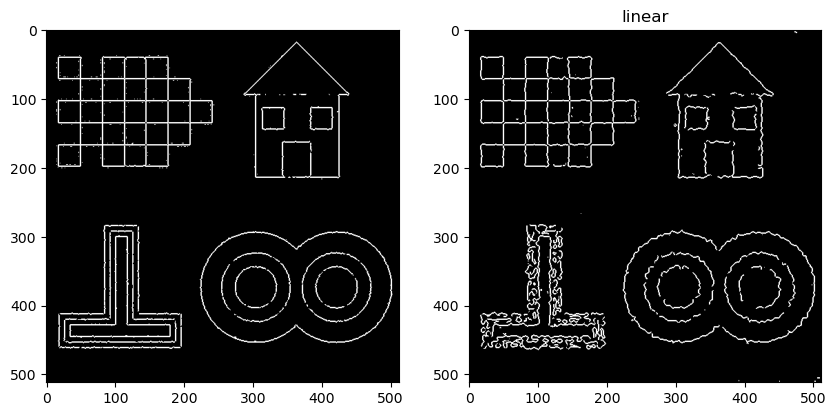

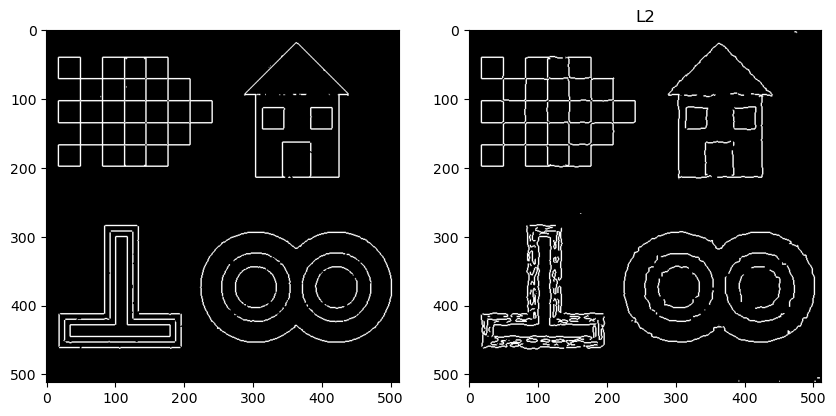

In [7]:
#Testing EdgeDetect on 2 different images
edges1 = EdgeDetect(image1,1.5,0.2,'linear') #Edges using PSNR=20dB
edges2 = EdgeDetect(image2,3,0.2,'linear')  #Edges using PSNR=10dB

fig,axis = plt.subplots(1,2,figsize = (10,30))
axis[0].imshow(edges1,cmap = "gray")
axis[1].imshow(edges2,cmap = "gray")
plt.title("linear")
plt.show()

edges1 = EdgeDetect(image1,1.5,0.2,'non-linear') #Edges using PSNR=20dB
edges2 = EdgeDetect(image2,3,0.2,'non-linear')  #Edges using PSNR=10dB

fig,axis = plt.subplots(1,2,figsize = (10,30))
axis[0].imshow(edges1,cmap = "gray")
axis[1].imshow(edges2,cmap = "gray")
plt.title("L2")
plt.show()


## 1.3 Αξιολόγηση Αποτελεσμάτων Ανίχνευσης Ακμών

Text(0.5, 1.0, '"Real" edges of original image')

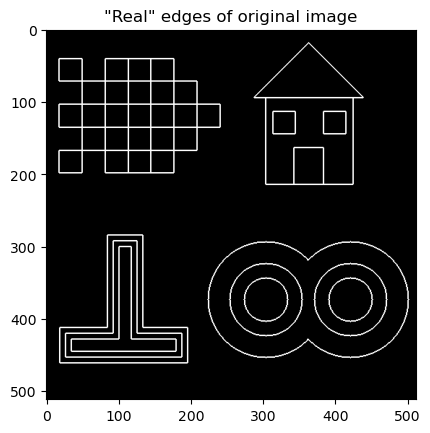

In [8]:
#1.3.1
#Finding "real" edges
def real_edges_detect(image,theta_real):
  kernel = np.array([[0,1,0],
                  [1,1,1],
                  [0,1,0]], dtype=np.uint8)

  M = cv2.dilate(image,kernel) - cv2.erode(image,kernel)
  T = M>theta_real
  T = T.astype(np.uint8)
  return T
  
real_edges = real_edges_detect(image,0.1)

plt.imshow(real_edges,cmap = "gray")
plt.title('"Real" edges of original image')

In [9]:
#1.3.2
def detection_quality(real_edges,
                      my_edges):
  precision = (real_edges & my_edges).sum()/real_edges.sum()
  recall = (real_edges & my_edges).sum()/my_edges.sum()

  return (precision+recall)/2

detection_quality(real_edges,edges2)

0.7333901416576194

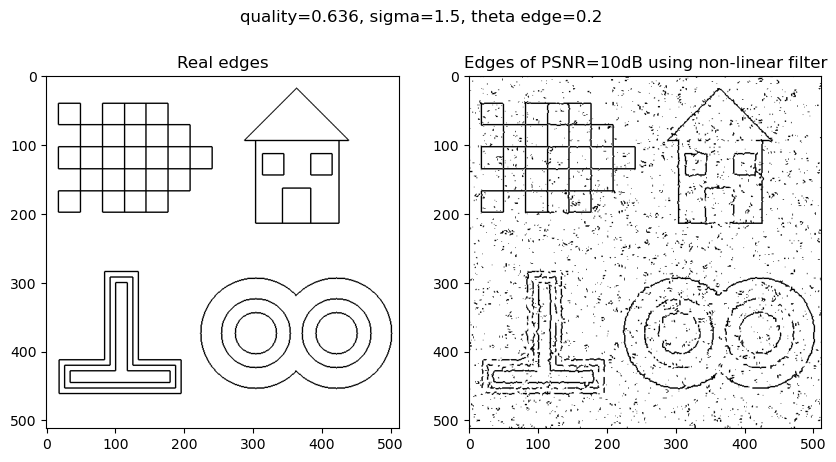

0.6356707819397833

In [10]:
def testing(image, PSNR, theta_edge, theta_real,sigma,filter_type):
  img_height, img_width = image.shape
  img_max = image.max()
  img_min = image.min()
  noise_sigma = sigma_n(PSNR,img_max,img_min)

  #apply noise to the image
  noised_img = image + np.random.normal(0,noise_sigma,size=(img_height,img_width))

  #find edges of noised image
  noised_edges = EdgeDetect(noised_img,sigma,theta_edge,filter_type)

  #find real edges
  real_edges = real_edges_detect(image,theta_real)

  #calculate quality
  quality = detection_quality(real_edges,noised_edges)
  q = round(quality,3)
  fig ,axis = plt.subplots(1,2,figsize = (10,5))
  axis[0].imshow(real_edges,cmap="gray_r")
  axis[0].set_title("Real edges")
  axis[1].imshow(noised_edges,cmap = "gray_r")
  axis[1].set_title(f"Edges of PSNR={PSNR}dB using {filter_type} filter")
  fig.suptitle(f"quality={q}, sigma={sigma}, theta edge={theta_edge}")
  plt.show()

  return quality

testing(image,PSNR=10,theta_edge=0.2,theta_real=0.1,sigma=1.5,filter_type='non-linear')
  

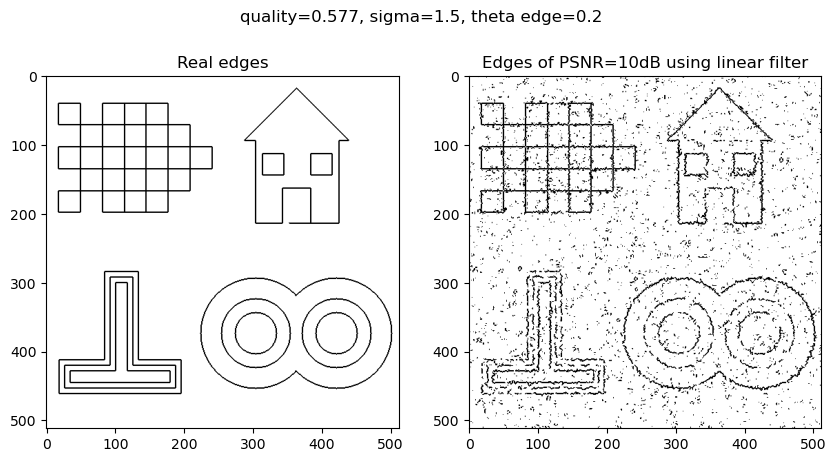

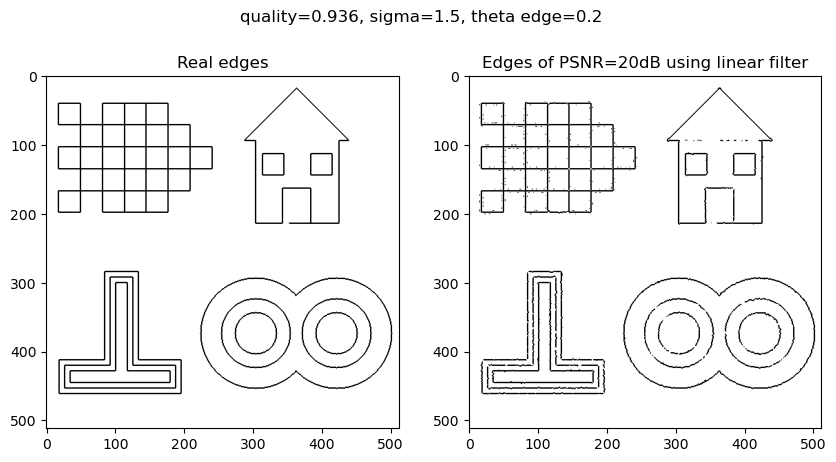

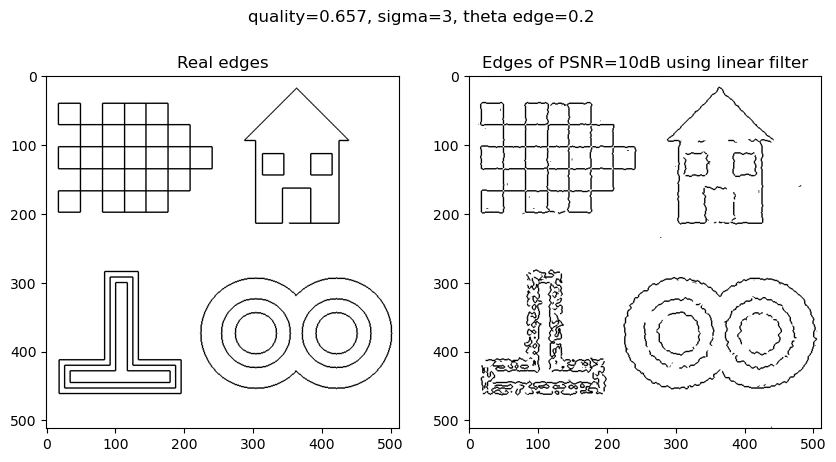

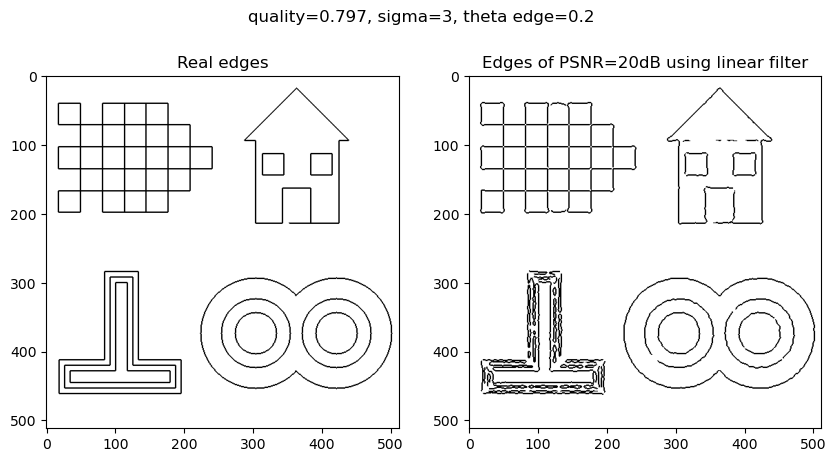

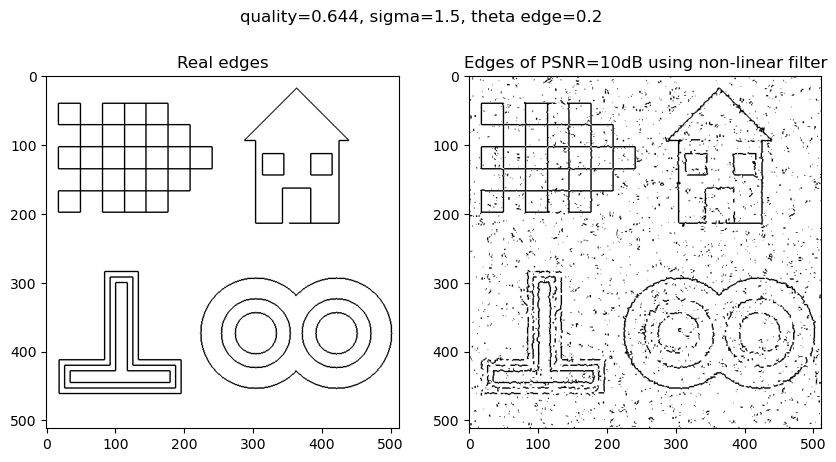

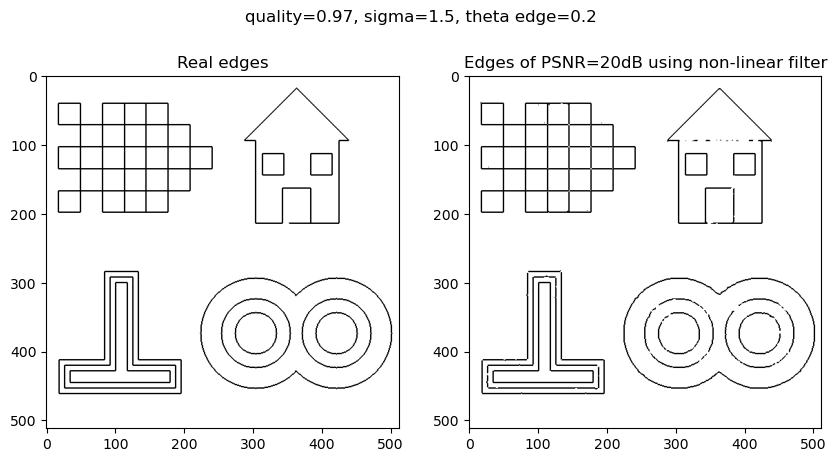

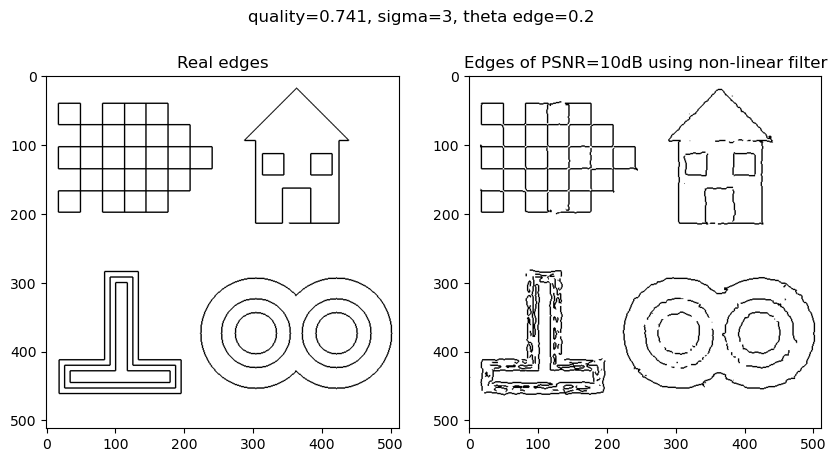

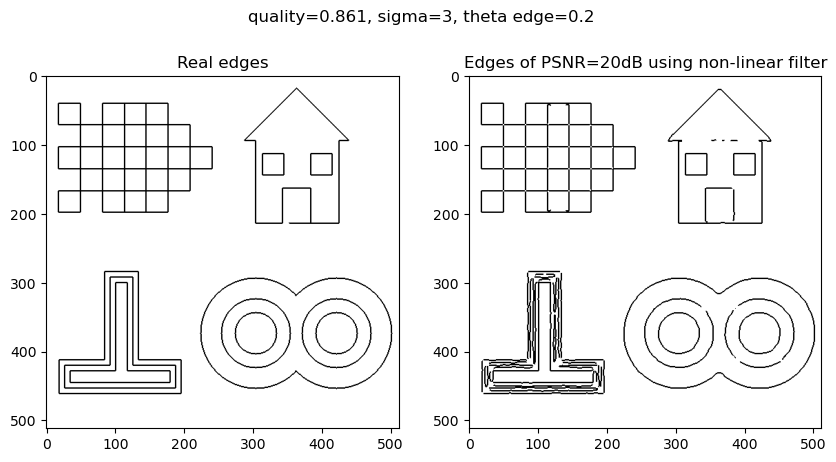

In [11]:
#1.3.3
#Testing session

#Test several sigma,theta,PSNR on L1 filtering
theta_real = 0.2

filters = ['linear','non-linear']
sigmas = [1.5,3]
PSNR = [10,20]
thetas = [0.2]

for f in filters:
  for s in sigmas:
    for p in PSNR:
      for th in thetas:
        q = testing(image=image,PSNR=p,theta_edge=th,theta_real=theta_real,sigma=s,filter_type=f)

## 1.4 Εφαρμογή σε πραγματικές εικόνες 

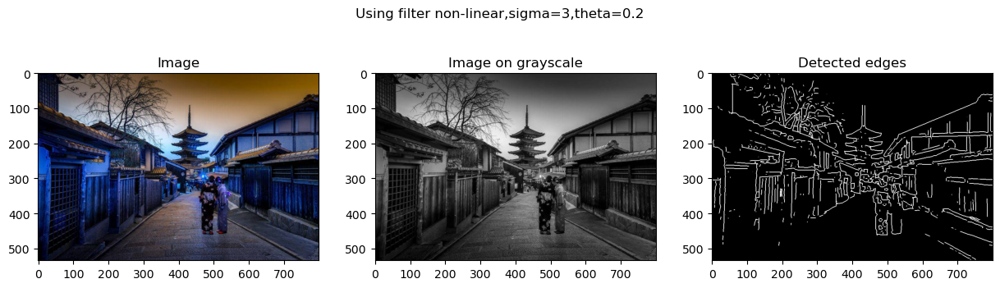

In [12]:
real_image = cv2.imread("kyoto_edges.jpg")
gray_image = cv2.imread("kyoto_edges.jpg",cv2.IMREAD_GRAYSCALE)

gray_image = gray_image.astype(np.uint8)/255

sigma = 3
theta = 0.2
filter = 'non-linear'

detected_edges = EdgeDetect(gray_image,sigma=sigma,theta=theta,type_of_filter=filter)

fig,axis = plt.subplots(1,3,figsize=(15,4))
axis[0].imshow(real_image)
axis[0].set_title("Image")
axis[1].imshow(gray_image,cmap="gray")
axis[1].set_title("Image on grayscale")
axis[2].imshow(detected_edges,cmap='gray')
axis[2].set_title("Detected edges")
fig.suptitle(f"Using filter {filter},sigma={sigma},theta={theta}")
plt.show()


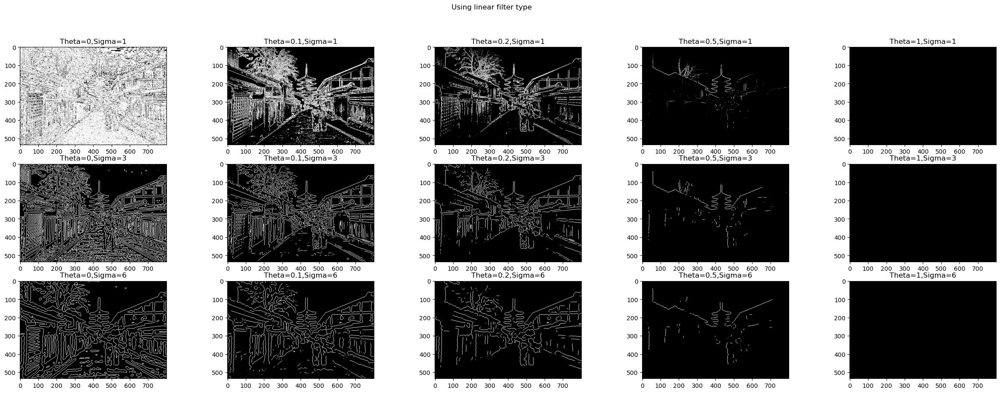

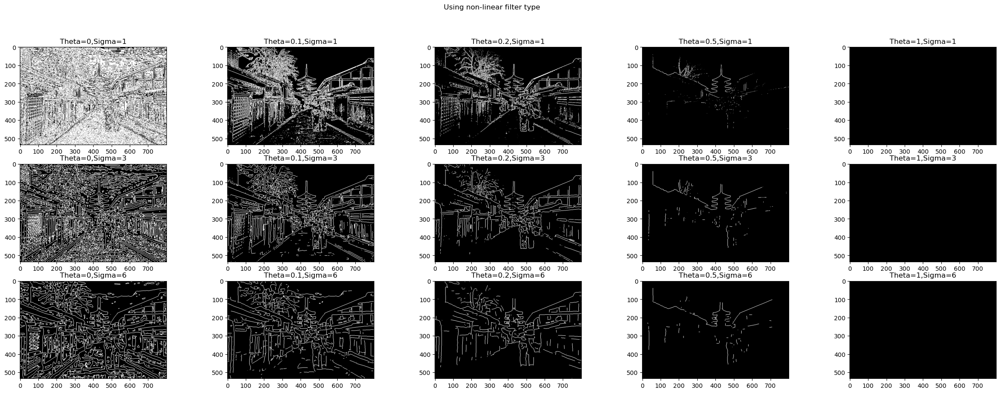

In [13]:
#Testing for several sigmas and thetas
thetas = [0, 0.1, 0.2, 0.5, 1]
sigmas = [1, 3, 6]
filter = ['linear','non-linear']

for f in filters:
  fig, axis = plt.subplots(len(sigmas),len(thetas),figsize=(30,10))
  for i,s in enumerate(sigmas):
    for j,th in enumerate(thetas):
      detected_edges = EdgeDetect(gray_image,sigma=s,theta=th,type_of_filter=f)
      axis[i][j].imshow(detected_edges,cmap='gray')
      axis[i][j].set_title(f"Theta={th},Sigma={s}")
  fig.suptitle(f"Using {f} filter type")
  plt.show()
  print('\n')

Text(0.5, 1.0, 'Non-linear filter, sigma=3, theta=0.1')

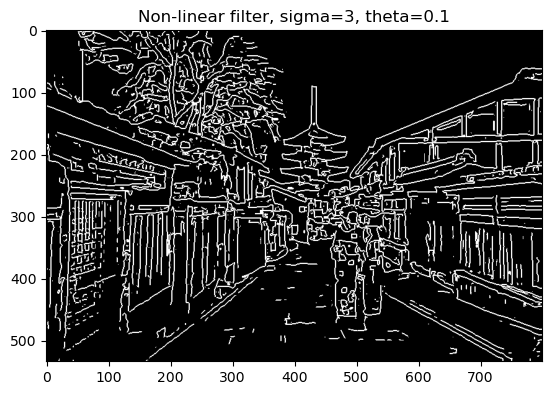

In [14]:
#our best result
best_edges = EdgeDetect(gray_image,sigma=3,theta=0.1,type_of_filter='non-linear')
plt.imshow(best_edges,cmap='gray')
plt.title("Non-linear filter, sigma=3, theta=0.1")

MyTest

# Μέρος 2. Ανίχνευση Σημείων Ενδιαφέροντος (Interest point detection)

## 2.1 Ανίχνευση Γωνιών (χρήση Harris Detector)

Ανίχνευση γωνιών σε μια κλίμακα, η οποία οριζόταν από τις σ και p τυπικών αποκλίσεων των Gaussians

In [15]:
#2.1.1
sigma = 1.5 #differention factor
ns = int(2*np.ceil(3*sigma)+1) 
gauccian_1D = cv2.getGaussianKernel(ns,sigma)
gauccian_2D = gauccian_1D @ gauccian_1D.T

smoothed_kyoto = cv2.filter2D(gray_image,-1,gauccian_2D)

gradient_kyoto = np.gradient(smoothed_kyoto) #[0]: x axis deriv, [1]: y axis deriv

p = 1.5 #integration factor
n_p=int(2*np.ceil(3*p)+1) 
gp_1D = cv2.getGaussianKernel(n_p,p)
gp_2D = gp_1D @ gp_1D.T

#calculating J1,J2,J3 of J tensor
J1 = cv2.filter2D((gradient_kyoto[0]*gradient_kyoto[0]),-1,gp_2D)
J2 = cv2.filter2D((gradient_kyoto[0]*gradient_kyoto[1]),-1,gp_2D)
J3 = cv2.filter2D((gradient_kyoto[1]*gradient_kyoto[1]),-1,gp_2D)

Text(0.5, 1.0, 'Lambda -')

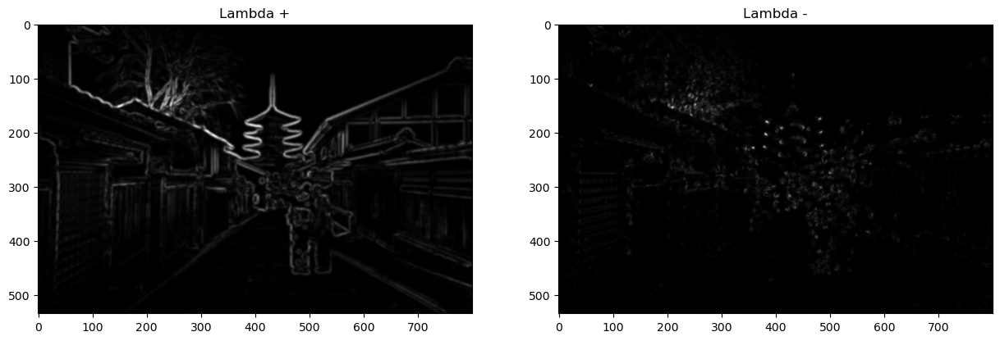

In [16]:
#2.1.2
#calculating the eigenvalues of J tensor
lambda_plus = (1/2)*(J1+J3+np.sqrt( (J1-J3)**2 + 4*J2**2 ))
lambda_minus = (1/2)*(J1+J3-np.sqrt( (J1-J3)**2 + 4*J2**2 ))

fig, axis = plt.subplots(1,2,figsize=(15,6))
axis[0].imshow(lambda_plus,cmap="gray")
axis[0].set_title("Lambda +")
axis[1].imshow(lambda_minus,cmap="gray")
axis[1].set_title("Lambda -")

Παρατηρούμε ότι οι λ+ αντιστοιχούν σε ακμές και σε γωνίες, ενώ αντίθετα τα λ- μόνο σε γωνίες (από ότι βλέπουμε από τις παραπάνω δύο φωτογραφίες).
Αυτό είναι αποτέλεσμα του Harris Detector, αφού στις ακμές η μία ιδιοτιμή είναι μεγαλύτερη της άλλης (συνεπώς είναι θετική) ενώ μονάχα σε γωνίες  οι δύο ιδιοτιμές έχουν ίδιες τιμές (όπως φαίνεται από το γεγονός ότι οι εικόνες lamba+ και lamba- "μοιράζονται" κάποια pixels).

In [17]:
#2.1.3
#calculating the cornerness criterion
k = 0.1
R = lambda_minus*lambda_plus - k*(lambda_minus + lambda_plus)**2

#condition 1: pixels of R that are the max in a window determned by sigma
from cv23_lab1_part2_utils import disk_strel
import cv23_lab1_part2_utils as utils

ns = int(np.ceil(3*sigma)*2+1)
B_sq = disk_strel(ns)
Cond1 = ( R == cv2.dilate(R,B_sq)) 

#condition 2: pixels (x,y) where R(x,y)>theta_corn*Rmax
theta_corn = 0.05
Rmax = R.max()
Cond2 = ( R >theta_corn*Rmax )

In [18]:
def harris_stephens_detector(s,p,image,k): 
  #calculate sigma gauccians
  n_s = int(2*np.ceil(3*s)+1) 
  gs_1D = cv2.getGaussianKernel(n_s,s)
  gs_2D = gs_1D @ gs_1D.T

  #calculate p gauccians
  n_p = int(2*np.ceil(3*p)+1) 
  gp_1D = cv2.getGaussianKernel(n_p,p)
  gp_2D = gp_1D @ gp_1D.T

  Is= cv2.filter2D(image,-1,gs_2D)
  gradient = np.gradient(Is)

  #calculating J1,J2,J3 of J tensor
  J1 = cv2.filter2D((gradient[0]*gradient[0]),-1,gp_2D)
  J2 = cv2.filter2D((gradient[0]*gradient[1]),-1,gp_2D)
  J3 = cv2.filter2D((gradient[1]*gradient[1]),-1,gp_2D)

  #calculating the eigenvalues of J tensor
  lambda_plus = (1/2)*(J1+J3+np.sqrt( (J1-J3)**2 + 4*J2**2 ))
  lambda_minus = (1/2)*(J1+J3-np.sqrt( (J1-J3)**2 + 4*J2**2 ))
  
  #calculating the cornerness criterion
  R = lambda_minus*lambda_plus - k*(lambda_minus + lambda_plus)**2

  #condition 1: pixels of R that are the max in a window determned by sigma
  from cv23_lab1_part2_utils import disk_strel
  import cv23_lab1_part2_utils as utils

  ns = int(np.ceil(3*s)*2+1)
  B_sq = disk_strel(ns)
  Cond1 = ( R == cv2.dilate(R,B_sq)) 

  #condition 2: pixels (x,y) where R(x,y)>theta_corn*Rmax
  theta_corn = 0.05
  Rmax = R.max()
  Cond2 = ( R >theta_corn*Rmax )

  corners = np.logical_and(Cond1,Cond2)
  corners = corners.astype(int)
  rows,cols = corners.shape
  points = []
  for y in range(rows):
    for x in range(cols):
      if corners[y][x]>0:
          points.append([x,y,s])

  return np.array(points)


<AxesSubplot:>

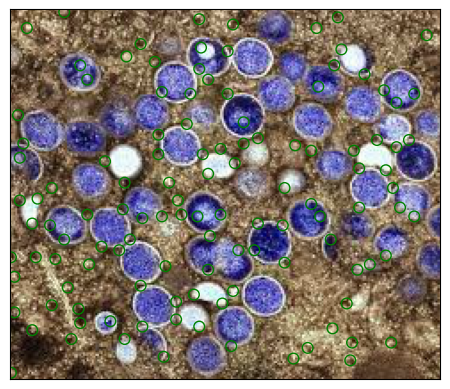

In [19]:
from cv23_lab1_part2_utils import interest_points_visualization as visualise

cells = cv2.imread("cells.jpg")
cells_gray = cv2.imread("cells.jpg",cv2.IMREAD_GRAYSCALE)
points= harris_stephens_detector(s=1,p=1.5,k=0.1,image=cells_gray)

visualise(cells,points)

<AxesSubplot:>

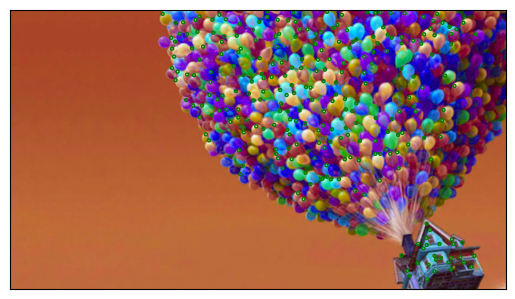

In [20]:
up = cv2.imread("up.png")
up_gray = cv2.imread("up.png",cv2.IMREAD_GRAYSCALE)
points= harris_stephens_detector(s=1,p=1.5,k=0.1,image=up_gray)

visualise(up,points)

<AxesSubplot:>

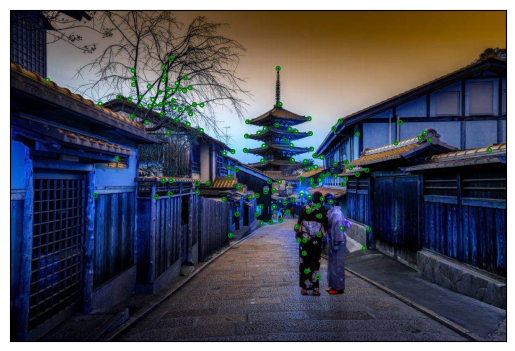

In [21]:
kyoto = cv2.imread("kyoto_edges.jpg")
kyoto_gray = cv2.imread("kyoto_edges.jpg",cv2.IMREAD_GRAYSCALE)
points= harris_stephens_detector(s=1,p=1.5,k=0.1,image=kyoto_gray)

visualise(kyoto,points)

## 2.2 Πολυκλιμακωτή Ανίχνευση Γωνιών

In [22]:
#2.2.1
#Finding the corners for multiple scaling factors
def find_all_corners(s0,p0,scale,N,image,k):
  all_scales = [(s0*scale**i,p0*scale**i) for i in range(N)] #create all scales
  corners_coord = []
  for s_i,p_i in all_scales:
    points = harris_stephens_detector(s=s_i,p=p_i,image=image,k=k)
    corners_coord.append(points)
  return corners_coord


In [23]:
# 2.2.2 
# Calculating normalised LoG for each image and sigma
def normalised_Log(image,sigma):
  n = int(2*np.ceil(3*sigma)+1)
  g1D = cv2.getGaussianKernel(n,sigma)
  g2D = g1D @ g1D.T
  L = cv2.filter2D(image,-1,g2D) #Laplaccian L of image
  Lx = np.gradient(L)[0]
  Ly = np.gradient(L)[1]
  Lxx = np.gradient(Lx)[0]
  Lyy = np.gradient(Ly)[1]
  return (sigma**2)*np.abs(Lxx+Lyy)

def find_all_LoG(image,s0,scale,N):
  all_sigmas = [s0*scale**i for i in range(N)]
  all_LoG = []
  for s in all_sigmas:
    img = normalised_Log(image,s)
    all_LoG.append(img)
  return all_LoG,all_sigmas


In [24]:
def harris_laplace_detector(image,s0,p0,scale,N):
  print("Starting harris laplace...")
  all_logs,all_sigmas = find_all_LoG(image=image,s0=s0,scale=scale,N=N)
  print("LoGs and sigmas calculated")  
  all_corners = find_all_corners(image=image,s0=s0,p0=p0,scale=s,N=N,k=0.1)
  print("Corners found")
  print("Starting calculating multiscalar corners...")
  result = [] #contains the coordinates of final edges
  for index in range(0,N):
    print(f"iteration number: {index+1} of {N}")
    corner_coord = all_corners[index]
    cur_log = all_logs[index]
    if(index>0 and index<N-1):
        prev_log = all_logs[index-1]
        next_log = all_logs[index+1]
    elif(index==0):
        prev_log = all_logs[index+1]
        next_log = all_logs[index+1]
    elif(index==N-1):
        prev_log = all_logs[index-1]
        next_log = all_logs[index-1]

    for p in corner_coord:
      x = int(p[0])
      y = int(p[1])
      if (cur_log[y][x]>prev_log[y][x]) and (cur_log[y][x]>next_log[y][x]):
        result.append([x,y,all_sigmas[index]])
          
  return np.array(result)

Starting harris laplace...
LoGs and sigmas calculated
Corners found
Starting calculating multiscalar corners...
iteration number: 1 of 4
iteration number: 2 of 4
iteration number: 3 of 4
iteration number: 4 of 4


<AxesSubplot:>

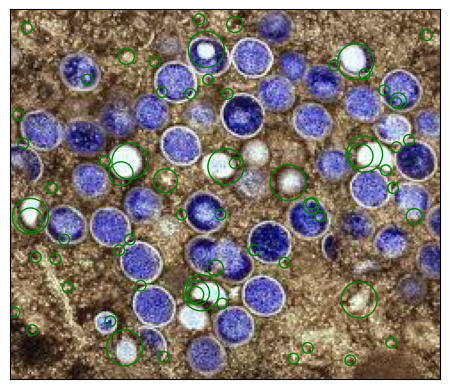

In [25]:
s0=1
p0=1.5
N=4
s=1.5
res = harris_laplace_detector(image=cells_gray,s0=s0,p0=p0,scale=s,N=N)
visualise(cells,res)


Starting harris laplace...
LoGs and sigmas calculated
Corners found
Starting calculating multiscalar corners...
iteration number: 1 of 4
iteration number: 2 of 4
iteration number: 3 of 4
iteration number: 4 of 4


<AxesSubplot:>

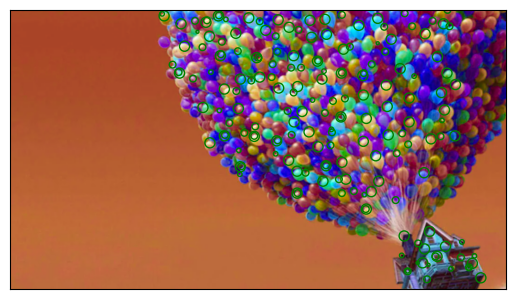

In [26]:
res = harris_laplace_detector(image=up_gray,s0=s0,p0=p0,scale=s,N=N)
visualise(up,res)

Starting harris laplace...
LoGs and sigmas calculated
Corners found
Starting calculating multiscalar corners...
iteration number: 1 of 4
iteration number: 2 of 4
iteration number: 3 of 4
iteration number: 4 of 4


<AxesSubplot:>

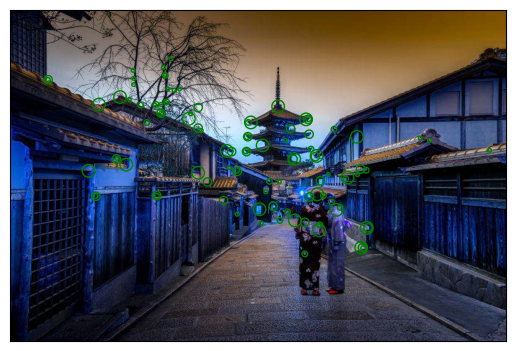

In [27]:
res = harris_laplace_detector(image=kyoto_gray,s0=s0,p0=p0,scale=s,N=N)
visualise(kyoto,res)

## 2.3 Ανίχνευση Blobs

In [28]:
#2.3.1
def hessian_detector(image,sigma,theta_corn):
  n = int(2*np.ceil(3*sigma)+1) 
  gauccian_1D = cv2.getGaussianKernel(n,s)
  gauccian_2D = gauccian_1D @ gauccian_1D.T
  Is = cv2.filter2D(image,-1,gauccian_2D) #blurred image

  #Calculate gradients
  Lx = np.gradient(Is)[0]
  Ly = np.gradient(Is)[1]
  Lxx = np.gradient(Lx)[0]
  Lyy = np.gradient(Ly)[1]
  Lxy = np.gradient(Lx)[1]

  #H = [[Lxx,Lxy],[Lxy,Lyy]] Hessian Matrix
  H = np.concatenate([np.concatenate([Lxx,Lyy],axis=1),np.concatenate([Lxy,Lyy],axis=1)],axis=0)
  R = Lxx*Lyy - (Lxy)**2
  Rmax = R.max()

  #condition 1: pixels of R that are the max in a window determned by sigma
  from cv23_lab1_part2_utils import disk_strel
  import cv23_lab1_part2_utils as utils

  ns = int(np.ceil(3*sigma)*2+1)
  B_sq = disk_strel(ns)
  Cond1 = ( R == cv2.dilate(R,B_sq)) 

  #condition 2: pixels (x,y) where R(x,y)>theta_corn*Rmax
  theta_corn = 0.05
  Rmax = R.max()
  Cond2 = ( R >theta_corn*Rmax )

  corners = np.logical_and(Cond1,Cond2)
  h,w = corners.shape
  points = []
  for y in range(h):      #pick row
    for x in range(w):    #pick column
      if corners[y][x]>0:
        points.append([x,y,sigma])
  return np.array(points)


<AxesSubplot:>

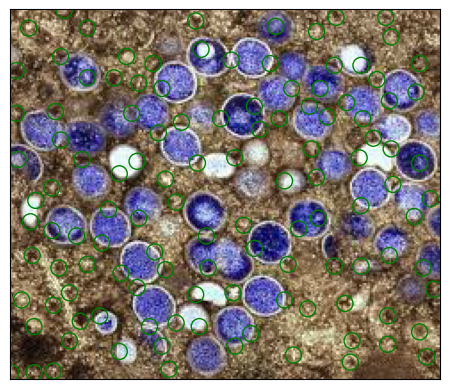

In [29]:
cells = cv2.imread("cells.jpg")
cells_gray = cv2.imread("cells.jpg",cv2.IMREAD_GRAYSCALE)
points = hessian_detector(image=cells_gray,sigma=1.5,theta_corn=0.2)
visualise(cells,points)

<AxesSubplot:>

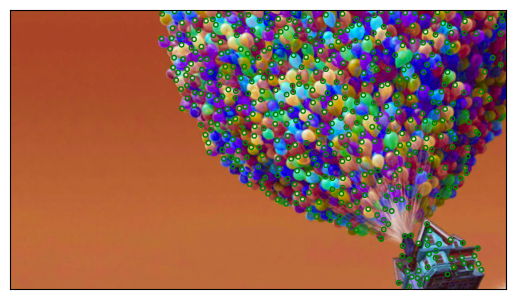

In [30]:
up = cv2.imread("up.png")
up_gray = cv2.imread("up.png",cv2.IMREAD_GRAYSCALE)
points = hessian_detector(image=up_gray,sigma=1.5,theta_corn=0.2)
visualise(up,points)

<AxesSubplot:>

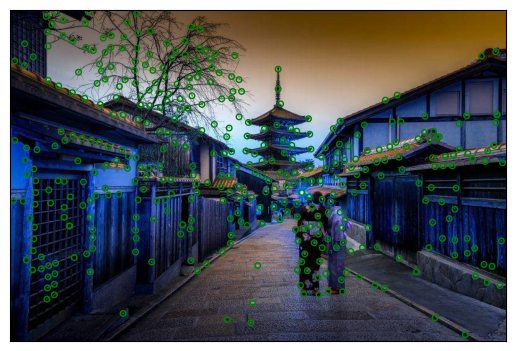

In [31]:
points = hessian_detector(image=kyoto_gray,sigma=1.5,theta_corn=0.2)
visualise(kyoto,points)

## 2.4 Πολυκλιμακωτή Ανίχνευση Blobs

In [32]:
def find_all_blobs(image,sigma,theta,scale,N):
  all_sigmas = [(sigma*(scale**i)) for i in range(N)]
  all_points = []
  for s in all_sigmas:
    p = hessian_detector(image=image,sigma=s,theta_corn=theta)
    all_points.append(p)
  return all_points


In [33]:
def hessian_laplace_detector(image,s0,scale,N,theta):
  all_logs,all_sigmas = find_all_LoG(image=image,s0=s0,scale=scale,N=N)
  all_corners = find_all_blobs(image=image,sigma=s0,scale=scale,N=N,theta=theta)
  result = [] #contains the coordinates of final edges
  for index in range(0,N):
    corner_coord = all_corners[index]
    cur_log = all_logs[index]
    if(index>0 and index<N-1):
      prev_log = all_logs[index-1]
      next_log = all_logs[index+1]
    elif(index==0):
      prev_log = all_logs[index+1]
      next_log = all_logs[index+1]
    elif(index==N-1):
      prev_log = all_logs[index-1]
      next_log = all_logs[index-1]

    for p in corner_coord:
      x = int(p[0])
      y = int(p[1])
      if (cur_log[y][x]>prev_log[y][x]) and (cur_log[y][x]>next_log[y][x]):
        result.append([x,y,all_sigmas[index]])
          
  return np.array(result)

<AxesSubplot:>

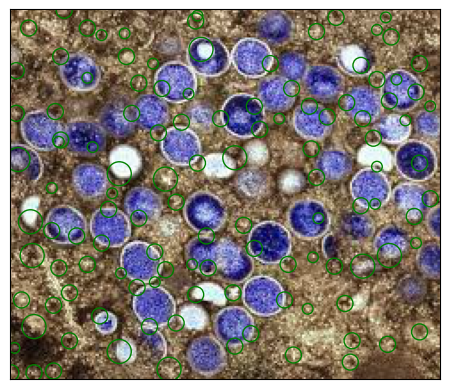

In [34]:
res = hessian_laplace_detector(image=cells_gray,s0=1,scale=1.5,N=4,theta=0.2)
visualise(cells,res)

<AxesSubplot:>

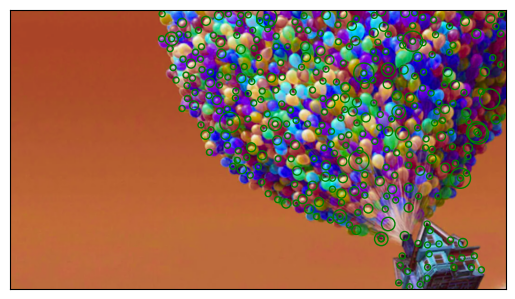

In [35]:
res = hessian_laplace_detector(image=up_gray,s0=2,scale=1.5,N=4,theta=0.2)
visualise(up,res)

<AxesSubplot:>

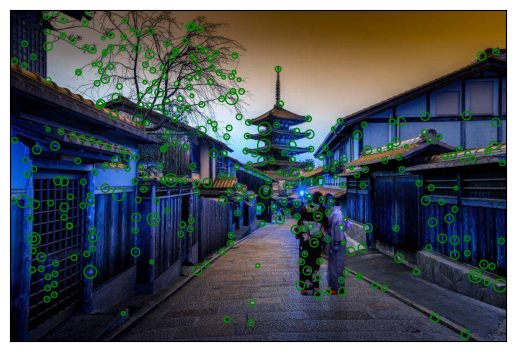

In [36]:
res = hessian_laplace_detector(image=kyoto_gray,s0=1,scale=1.5,N=4,theta=0.2)
visualise(kyoto,res)

## 2.5 Επιτάχυνση με την χρήση Box Filters και Ολοκληρωτικών Εικόνων (Integral Images)

In [37]:
def Hessian_aprox(image, sigma, visualize_R = False):
    # Calculate cummulative sum of image
    cumsum = np.cumsum(image, 0, dtype = "float64")
    cumsum = np.cumsum(cumsum, 1, dtype = "float64")

    n = 2*np.ceil(3*sigma)+1

    dim1 = int(4*np.floor(n/6)+1)
    dim2 = int(2*np.floor(n/6)+1)
    rect_box = np.asarray([[1]*dim2]*dim1)
    trans_rect_box = np.transpose(rect_box)
    squares = np.asarray([[1]*dim2]*dim2)


    filter_n = 3*dim2
    image_y_size = int(image.shape[0])
    image_x_size = int(image.shape[1])

    # Calculate Lxx
    Lxx = np.asarray([[0]*image_x_size]*image_y_size);
    Lyy = np.asarray([[0]*image_x_size]*image_y_size);
    Lxy = np.asarray([[0]*image_x_size]*image_y_size);

    def calc_box_sum(cumsum, y, x, dimy, dimx):
        return cumsum[y - dimy//2][x - dimx//2] + cumsum[y + dimy//2][x + dimx//2] - cumsum[y - dimy//2][x + dimx//2] - cumsum[y + dimy//2][x - dimx//2]

    for i in range(filter_n//2, image_y_size - filter_n//2):
        for j in range(filter_n//2, image_x_size - filter_n//2):
            Lxx[i, j] = calc_box_sum(cumsum, i, j - dim2, dim1, dim2) - 2*calc_box_sum(cumsum, i, j, dim1, dim2) + calc_box_sum(cumsum, i, j + dim2, dim1, dim2)
            Lyy[i][j] = calc_box_sum(cumsum, i - dim2, j, dim2, dim1) - 2*calc_box_sum(cumsum, i, j, dim2, dim1) + calc_box_sum(cumsum, i + dim2, j, dim2, dim1)
            Lxy[i][j] = calc_box_sum(cumsum, i - dim2//2 - 1, j - dim2//2 - 1, dim2, dim2) - calc_box_sum(cumsum, i - dim2//2 - 1, j + dim2//2 + 1, dim2, dim2) \
                        - calc_box_sum(cumsum, i + dim2//2 + 1, j - dim2//2 - 1, dim2, dim2) + calc_box_sum(cumsum, i + dim2//2 + 1, j + dim2//2 + 1, dim2, dim2)
    
    # Find interest points
    R = Lxx*Lyy - (0.9*Lxy)**2

    # Visualize the criterion
    if visualize_R:
        plt.imshow(R, cmap='gray', vmin=np.amin(R), vmax=np.amax(R))
        plt.title("Visualization of R criterion")
        plt.show()


    # Find local maxima
    B_sq = disk_strel(n)
    Cond1 = ( R==cv2.dilate(R,B_sq) )

    # Find corner condition
    Rmax = np.amax(R)
    Cond2 = R > theta_corn*Rmax

    # Find corners
    intersection = Cond1 & Cond2
    corners = []

    for i in range(0, intersection.shape[0]):
        for j in range(0, intersection.shape[1]):
            if intersection[i][j] == True:
                corners.append([j, i, sigma])
    
    return corners


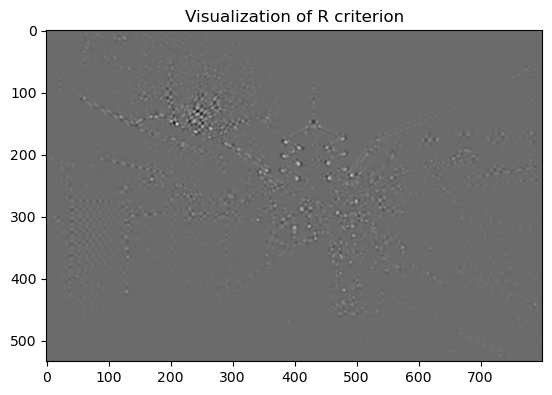

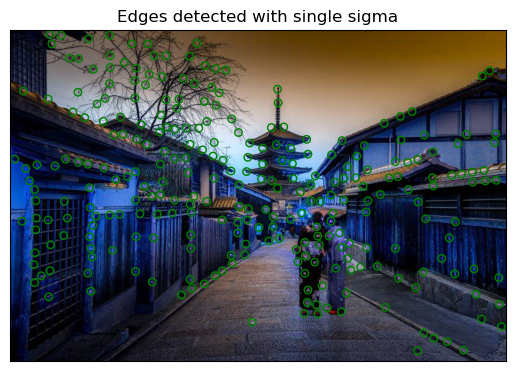

In [38]:
# Visualize points
corners = Hessian_aprox(kyoto_gray, 2, True)

visualise(kyoto, corners)
plt.title("Edges detected with single sigma")
plt.show()

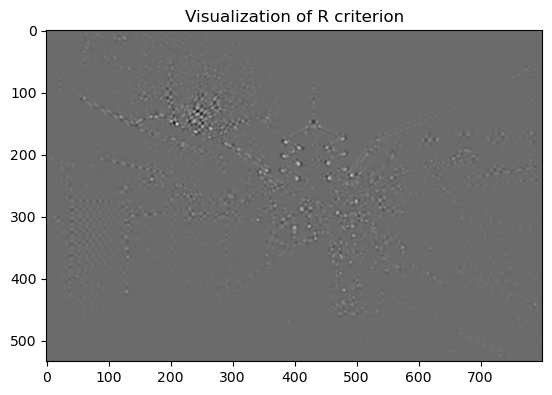

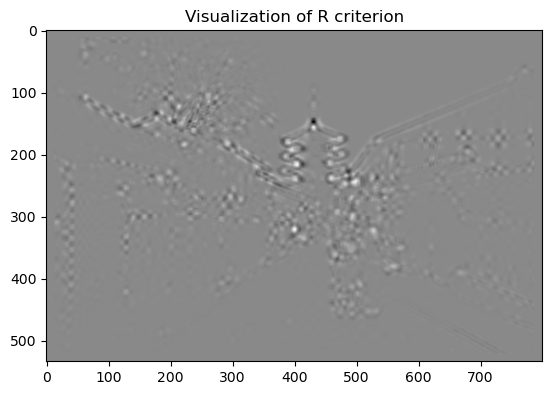

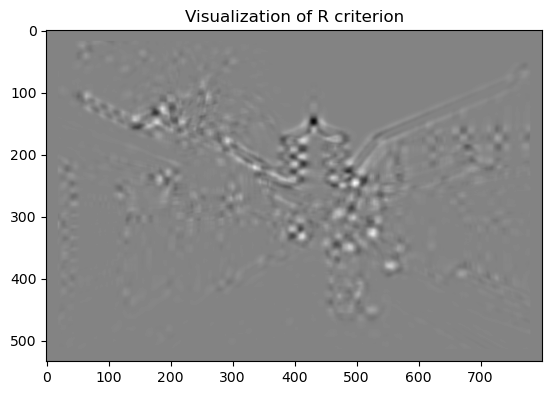

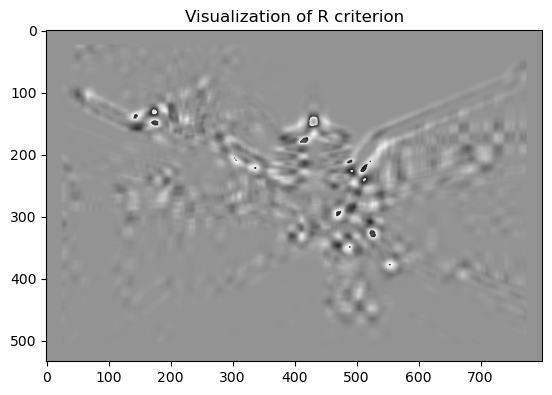

In [39]:
for s in range(2,9,2):
  corners = Hessian_aprox(kyoto_gray, s, True)

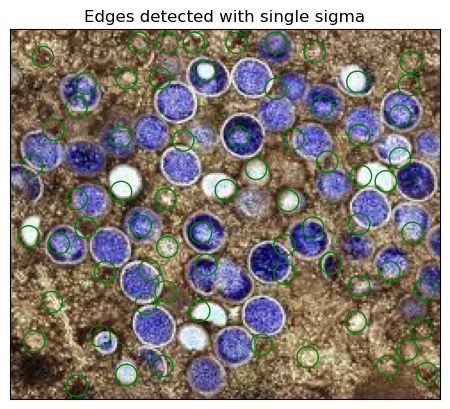

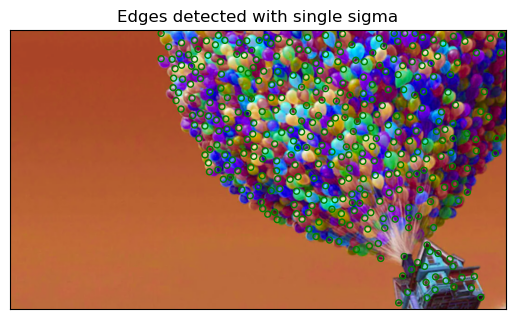

In [40]:
corners = Hessian_aprox(cells_gray, 2,False)
visualise(cells, corners)
plt.title("Edges detected with single sigma")
plt.show()

corners = Hessian_aprox(up_gray, 2, False)
visualise(up, corners)
plt.title("Edges detected with single sigma")
plt.show()

In [41]:
# Multiscale box filter
def find_all_box(image,sigma,scale,N):
  all_sigmas = [(sigma*(scale**i)) for i in range(N)]
  all_points = []
  for s in all_sigmas:
    p = Hessian_aprox(image=image,sigma=s)
    all_points.append(p)
  return np.array(all_points)


In [42]:
def box_multiscale(image,sigma,scale,N):
    all_logs,all_sigmas = find_all_LoG(image=image,s0=sigma,scale=scale,N=N)
    all_corners = find_all_box(image=image,sigma=sigma,scale=scale,N=N)
    result = []
    for index in range(0,N):
        corner_coord = all_corners[index]
        cur_log = all_logs[index]
        if(index>0 and index<N-1):
              prev_log = all_logs[index-1]
              next_log = all_logs[index+1]
        elif(index==0):
              prev_log = all_logs[index+1]
              next_log = all_logs[index+1]
        elif(index==N-1):
              prev_log = all_logs[index-1]
              next_log = all_logs[index-1]

        for p in corner_coord:
              x = int(p[0])
              y = int(p[1])
              if (cur_log[y][x]>prev_log[y][x]) and (cur_log[y][x]>next_log[y][x]):
                result.append([x,y,all_sigmas[index]])

    return np.array(result)

C:\Users\munro\anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:8: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  


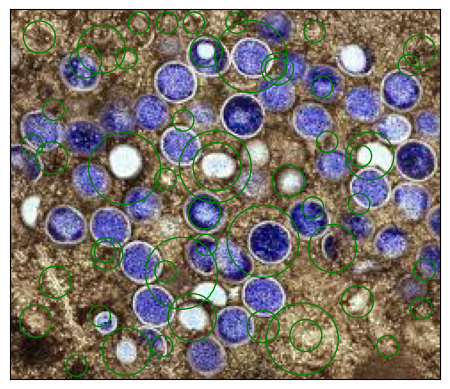

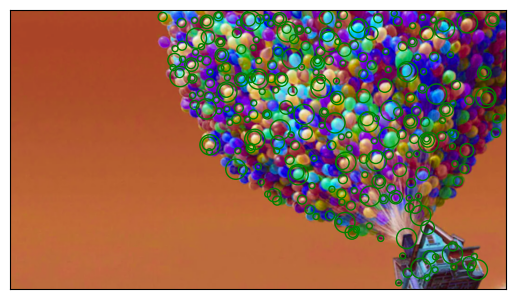

In [43]:
corners = box_multiscale(image=cells_gray,sigma=2,scale=1.5,N=4)
visualise(cells, corners)
plt.show()

corners = box_multiscale(image=up_gray,sigma=2,scale=1.5,N=4)
visualise(up, corners)
plt.show()

# Μέρος 3: Εφαρμογές σε Ταίριασμα και Κατηγοροποίηση Εικόνων με χρήση Τοπικών Περιγραφητών στα Σημεία Ενδιαφέροντος

## 3.1 Ταίριασμα Εικόνων υπό Περιστροφή και Αλλαγή Κλίμακας


In [44]:
#3.1.1
import cv23_lab1_part3_utils as p3

# using lambda as a wrapper for the used functions
# decription functions
surf = lambda I,kp: p3.featuresSURF(I,kp)
hog = lambda I,kp: p3.featuresHOG(I,kp)

# detection functions
harris = lambda I: harris_stephens_detector(image=I,s=2,p=1.5,k=0.1)
harris_laplace = lambda I: harris_laplace_detector(image=I,s0=1,p0=1.5,scale=1.5,N=4)
hessian = lambda I: hessian_detector(image=I,sigma=1,theta_corn=0.2)
hessian_laplace = lambda I: hessian_laplace_detector(image=I,s0=1,scale=1.5,N=4,theta=0.2)
box = lambda I: box_multiscale(image=I,sigma=1,scale=1.5,N=4)


In [45]:
from scipy.io import loadmat
file = loadmat("snrImgSet.mat") # reaturns a dictionary
image_set = file['ImgSet'][0] # contains 3 1x20 subsets

bike_set = image_set[0][0] # contains 20 versions of the same bike image
car_set = image_set[1][0]  # contains 20 versions of the same car image
family_set = image_set[2][0] # contains 20 versions of the same family image


In [46]:
# We used the code given in test_matching_evaluation.py

# calculating using surf
avg_scale_errors, avg_theta_errors = p3.matching_evaluation(harris, surf)
print("Results for Harris Detector and SURF:")
print(f'Avg. Scale Error for Image 1 : {avg_scale_errors[0]}')
print(f'Avg. Theta Error for Image 1 : {avg_theta_errors[0]}\n')

avg_scale_errors, avg_theta_errors = p3.matching_evaluation(hessian, surf)
print("Results for Hessian Detector and SURF:")
print(f'Avg. Scale Error for Image 1 : {avg_scale_errors[0]}')
print(f'Avg. Theta Error for Image 1 : {avg_theta_errors[0]}\n')

avg_scale_errors, avg_theta_errors = p3.matching_evaluation(hessian_laplace, surf)
print("Results for Multiscale Hessian Detector and SURF:")
print(f'Avg. Scale Error for Image 1 : {avg_scale_errors[0]}')
print(f'Avg. Theta Error for Image 1 : {avg_theta_errors[0]}\n')

avg_scale_errors, avg_theta_errors = p3.matching_evaluation(box, surf)
print("Results for Multiscale Box and SURF:")
print(f'Avg. Scale Error for Image 1 : {avg_scale_errors[0]}')
print(f'Avg. Theta Error for Image 1 : {avg_theta_errors[0]}\n')

'''
# this one takes a lot of time
avg_scale_errors, avg_theta_errors = p3.matching_evaluation(harris_laplace, surf)
print("Results for Multiscale Harris Detector and SURF:")
print(f'Avg. Scale Error for Image 1 : {avg_scale_errors[0]}')
print(f'Avg. Theta Error for Image 1 : {avg_theta_errors[0]}\n')
'''


Results for Harris Detector and SURF:
Avg. Scale Error for Image 1 : 0.003316394599950531
Avg. Theta Error for Image 1 : 0.17663001260578187

Results for Hessian Detector and SURF:
Avg. Scale Error for Image 1 : 0.004502154343958246
Avg. Theta Error for Image 1 : 0.5103729873356031

Results for Multiscale Hessian Detector and SURF:
Avg. Scale Error for Image 1 : 0.1020810701620162
Avg. Theta Error for Image 1 : 7.292960134156691



C:\Users\munro\anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:8: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  


Results for Multiscale Box and SURF:
Avg. Scale Error for Image 1 : 0.002110593067357041
Avg. Theta Error for Image 1 : 0.135049968328658



'\n# this one takes a lot of time\navg_scale_errors, avg_theta_errors = p3.matching_evaluation(harris_laplace, surf)\nprint("Results for Multiscale Harris Detector and SURF:")\nprint(f\'Avg. Scale Error for Image 1 : {avg_scale_errors[0]}\')\nprint(f\'Avg. Theta Error for Image 1 : {avg_theta_errors[0]}\n\')\n'

In [47]:
# calculating using hog
avg_scale_errors, avg_theta_errors = p3.matching_evaluation(harris, hog)
print("Results for Harris Detector and HOG:")
print(f'Avg. Scale Error for Image 1 : {avg_scale_errors[0]}')
print(f'Avg. Theta Error for Image 1 : {avg_theta_errors[0]}\n')

avg_scale_errors, avg_theta_errors = p3.matching_evaluation(hessian, hog)
print("Results for Harris Detector and HOG:")
print(f'Avg. Scale Error for Image 1 : {avg_scale_errors[0]}')
print(f'Avg. Theta Error for Image 1 : {avg_theta_errors[0]}\n')

avg_scale_errors, avg_theta_errors = p3.matching_evaluation(hessian_laplace, hog)
print("Results for Multiscale Hessian Detector and HOG:")
print(f'Avg. Scale Error for Image 1 : {avg_scale_errors[0]}')
print(f'Avg. Theta Error for Image 1 : {avg_theta_errors[0]}\n')

avg_scale_errors, avg_theta_errors = p3.matching_evaluation(box, hog)
print("Results for Multiscale Box and HOG:")
print(f'Avg. Scale Error for Image 1 : {avg_scale_errors[0]}')
print(f'Avg. Theta Error for Image 1 : {avg_theta_errors[0]}\n')

'''
# this one takes a lot of time
avg_scale_errors, avg_theta_errors = p3.matching_evaluation(harris_laplace, hog)
print("Results for Multiscale Harris Detector and HOG:")
print(f'Avg. Scale Error for Image 1 : {avg_scale_errors[0]}')
print(f'Avg. Theta Error for Image 1 : {avg_theta_errors[0]}\n')
 '''

Results for Harris Detector and HOG:
Avg. Scale Error for Image 1 : 0.1344098100010664
Avg. Theta Error for Image 1 : 14.114276263215611

Results for Harris Detector and HOG:
Avg. Scale Error for Image 1 : 0.21604820472385858
Avg. Theta Error for Image 1 : 25.659940371484133

Results for Multiscale Hessian Detector and HOG:
Avg. Scale Error for Image 1 : 0.47562113697578495
Avg. Theta Error for Image 1 : 32.0057095693603



C:\Users\munro\anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:8: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  


Results for Multiscale Box and HOG:
Avg. Scale Error for Image 1 : 0.13152315709186113
Avg. Theta Error for Image 1 : 7.266968451457085



'\n# this one takes a lot of time\navg_scale_errors, avg_theta_errors = p3.matching_evaluation(harris_laplace, hog)\nprint("Results for Multiscale Harris Detector and HOG:")\nprint(f\'Avg. Scale Error for Image 1 : {avg_scale_errors[0]}\')\nprint(f\'Avg. Theta Error for Image 1 : {avg_theta_errors[0]}\n\')\n '

## 3.2 Κατηγοροποίηση Εικόνων

In [48]:
# 3.2.1
# we already have created the wrappers of our detectors
# finding features using surf
feats_surf1 = p3.FeatureExtraction(harris_laplace,surf)

In [49]:
feats_surf2 = p3.FeatureExtraction(hessian_laplace,surf)

Time for feature extraction: 418.668


In [50]:
feats_surf3 = p3.FeatureExtraction(box,surf)

C:\Users\munro\anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:8: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  


Time for feature extraction: 4495.274


In [51]:
# finding features using hog
feats_hog1 = p3.FeatureExtraction(harris_laplace,hog) 

In [52]:
feats_hog2 = p3.FeatureExtraction(hessian_laplace,hog)

Time for feature extraction: 436.727


In [53]:
feats_hog3 = p3.FeatureExtraction(box,hog)

C:\Users\munro\anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:8: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  


Time for feature extraction: 4459.035


In [54]:
# 3.2.2-3-4
# We used the given code from example_classification.py for each pair of functions
# Find accuracy for harris-surf
''' 
acc = []
for k in range(5):
    data_train, label_train, data_test, label_test = p3.createTrainTest(feats_surf1, k)
    BOF_tr, BOF_ts = p3.BagOfWords(data_train, data_test)
    acc, preds, probas = p3.svm(BOF_tr, label_train, BOF_ts, label_test)
    accs.append(acc)
print('Mean accuracy for Harris-Laplace with SURF descriptors: {:.3f}%'.format(100.0*np.mean(accs)))
'''


" \nacc = []\nfor k in range(5):\n    data_train, label_train, data_test, label_test = p3.createTrainTest(feats_surf1, k)\n    BOF_tr, BOF_ts = p3.BagOfWords(data_train, data_test)\n    acc, preds, probas = p3.svm(BOF_tr, label_train, BOF_ts, label_test)\n    accs.append(acc)\nprint('Mean accuracy for Harris-Laplace with SURF descriptors: {:.3f}%'.format(100.0*np.mean(accs)))\n"

In [56]:
# Find accuracy for hessian-surf
accs = []
for k in range(5):
    data_train, label_train, data_test, label_test = p3.createTrainTest(feats_surf2, k)
    BOF_tr, BOF_ts = p3.BagOfWords(data_train, data_test)
    acc, preds, probas = p3.svm(BOF_tr, label_train, BOF_ts, label_test)
    accs.append(acc)
print('Mean accuracy for Hessian-Laplace with SURF descriptors: {:.3f}%'.format(100.0*np.mean(accs)))

Mean accuracy for Hessian-Laplace with SURF descriptors: 47.448%


In [57]:
# Find accuracy for box-surf
accs = []
for k in range(5):
    data_train, label_train, data_test, label_test = p3.createTrainTest(feats_surf3, k)
    BOF_tr, BOF_ts = p3.BagOfWords(data_train, data_test)
    acc, preds, probas = p3.svm(BOF_tr, label_train, BOF_ts, label_test)
    accs.append(acc)
print('Mean accuracy for Multiscale Box with SURF descriptors: {:.3f}%'.format(100.0*np.mean(accs)))

Mean accuracy for Multiscale Box with SURF descriptors: 57.655%


In [ ]:
# Find accuracy for harris-hog
'''
TODO
acc = []
for k in range(5):
    data_train, label_train, data_test, label_test = p3.createTrainTest(feats_hog1, k)
    BOF_tr, BOF_ts = p3.BagOfWords(data_train, data_test)
    acc, preds, probas = p3.svm(BOF_tr, label_train, BOF_ts, label_test)
    accs.append(acc)
print('Mean accuracy for Harris-Laplace with HOG descriptors: {:.3f}%'.format(100.0*np.mean(accs)))
'''


In [58]:
# Find accuracy for hessian-hog
accs = []
for k in range(5):
    data_train, label_train, data_test, label_test = p3.createTrainTest(feats_hog2, k)
    BOF_tr, BOF_ts = p3.BagOfWords(data_train, data_test)
    acc, preds, probas = p3.svm(BOF_tr, label_train, BOF_ts, label_test)
    accs.append(acc)
print('Mean accuracy for Hessian-Laplace with HOG descriptors: {:.3f}%'.format(100.0*np.mean(accs)))

Mean accuracy for Hessian-Laplace with HOG descriptors: 59.862%


In [59]:
# Find accuracy for box-hog
accs = []
for k in range(5):
    data_train, label_train, data_test, label_test = p3.createTrainTest(feats_hog3, k)
    BOF_tr, BOF_ts = p3.BagOfWords(data_train, data_test)
    acc, preds, probas = p3.svm(BOF_tr, label_train, BOF_ts, label_test)
    accs.append(acc)
print('Mean accuracy for Multiscale Box with HOG descriptors: {:.3f}%'.format(100.0*np.mean(accs)))

Mean accuracy for Multiscale Box with HOG descriptors: 64.000%
